In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy import io
import os
import re

In [3]:
# This function is used for transforming the true (generating) parameters onto transformed space
def transform_params(param, lower_bound, upper_bound):
    return np.log(param/(upper_bound - param + 0.001))
#     return lower_bound + ((upper_bound - lower_bound) * (1 / (1+np.exp(-param))))

# Summary

1. $\alpha$ = learning rate (0 < $\alpha$ < 1)
2. $\kappa$ = coefficient multiplied to $\alpha$ for counterfactual update (0 < $\kappa$ < 1)
3. $\beta$ = inverse temperature (0 < $\beta$ < 10)
4. $w$ = model-based vs. model-free (0 < $w$ < 1)
5. $\gamma$ = decay rate (0 < $\gamma$ < 1)

C1 = counterfactual with 1 learning rate ($\alpha$), C2 = counterfactual with two learning rates ($\alpha$, $\kappa\alpha$)

## 1. Pearson's correlation in "true (bounded)" parameter space


|   |          | Total 200 trials |       |       |  100 trials per first-stage state |      |      |
:---|:----------:|------------|------|------|-----------------|------|------:
| Parameter  | n second-stage states | TD         | C1    | C2    | TD              | C1   | C2   |
| **$\alpha$**  | 2        | 0.54       | 0.72  | 0.63  | 0.49            | 0.58 | 0.54 |
|   | 3        | 0.46       | 0.58  | 0.43  | 0.52            | 0.57 | 0.56 |
|   | 4        | 0.44       | 0.5   | 0.42  | 0.49            | 0.59 | 0.54 |
|   | 5        | 0.39       | 0.4   | 0.36  | 0.54            | 0.57 | 0.49 |
| **$\kappa$**  | 2        |            |       | 0.4   |                 |      | 0.32 |
|   | 3        |            |       | 0.42  |                 |      | 0.5  |
|   | 4        |            |       | 0.35  |                 |      | 0.51 |
|   | 5        |            |       | 0.35  |                 |      | 0.54 |
| **$\beta$**  | 2        | 0.72       | 0.83  | 0.8   | 0.71            | 0.72 | 0.71 |
|   | 3        | 0.53       | 0.54  | 0.55  | 0.65            | 0.71 | 0.62 |
|   | 4        | 0.54       | 0.53  | 0.49  | 0.59            | 0.58 | 0.58 |
|   | 5        | 0.48       | 0.47  | 0.45  | 0.63            | 0.62 | 0.59 |
| **$w$**  | 2        | 0.65       | 0.66  | 0.62  | 0.58            | 0.54 | 0.48 |
|   | 3        | 0.56       | 0.64  | 0.54  | 0.68            | 0.66 | 0.64 |
|   | 4        | 0.55       | 0.52  | 0.5   | 0.63            | 0.65 | 0.62 |
|   | 5        | 0.49       | 0.52  | 0.48  | 0.68            | 0.69 | 0.68 |
| **$\gamma$**  | 2        | 0.57       | -0.05 | -0.03 | 0.48            | 0.04 | 0.02 |
|   | 3        | 0.51       | 0.57  | 0.51  | 0.65            | 0.62 | 0.59 |
|   | 4        | 0.52       | 0.47  | 0.47  | 0.62            | 0.66 | 0.6  |
|   | 5        | 0.42       | 0.49  | 0.46  | 0.62            | 0.68 | 0.67 |


 
 * Notes & thoughts:
1. 100 trials per first-stage state: experiments with 2 second-stage states have 100, 3 states have 300, 4 states have 600, and 5 states have 1000 total trials. Overall, more number of trials improve better than counterfactual alone for higher nstates.
2. $\gamma$s are 0 for counterfactual experiments with 2 second-stage states. This is because in 2-state condition in counterfactual settings you see the one and only first-stage-state every trial, so there's nothing to discount.

## 2. Pearson's correlation in "transformed" parameter space 

|              |                       | Total 200 trials |       |       |  100 trials per first-stage state |      |      |
|--------------|-----------------------|------------------|-------|-------|-----------------------------------|------|------|
| Parameter    | n second-stage states | TD               | C1    | C2    | TD                                | C1   | C2   |
| **$\alpha$** | 2                     | 0.5              | 0.69  | 0.61  | 0.49                              | 0.56 | 0.53 |
|              | 3                     | 0.44             | 0.57  | 0.43  | 0.51                              | 0.55 | 0.55 |
|              | 4                     | 0.4              | 0.47  | 0.41  | 0.49                              | 0.57 | 0.53 |
|              | 5                     | 0.38             | 0.4   | 0.37  | 0.55                              | 0.54 | 0.48 |
| **$\kappa$** | 2                     |                  |       | 0.42  |                                   |      | 0.33 |
|              | 3                     |                  |       | 0.42  |                                   |      | 0.5  |
|              | 4                     |                  |       | 0.35  |                                   |      | 0.51 |
|              | 5                     |                  |       | 0.35  |                                   |      | 0.53 |
| **$\beta$**  | 2                     | 0.68             | 0.57  | 0.55  | 0.53                              | 0.47 | 0.53 |
|              | 3                     | 0.52             | 0.41  | 0.39  | 0.51                              | 0.53 | 0.44 |
|              | 4                     | 0.51             | 0.37  | 0.36  | 0.46                              | 0.4  | 0.44 |
|              | 5                     | 0.47             | 0.36  | 0.37  | 0.48                              | 0.4  | 0.43 |
| **$w$**      | 2                     | 0.61             | 0.64  | 0.61  | 0.58                              | 0.54 | 0.48 |
|              | 3                     | 0.51             | 0.63  | 0.53  | 0.67                              | 0.64 | 0.62 |
|              | 4                     | 0.54             | 0.51  | 0.51  | 0.62                              | 0.63 | 0.62 |
|              | 5                     | 0.46             | 0.52  | 0.47  | 0.66                              | 0.68 | 0.66 |
| **$\gamma$** | 2                     | 0.53             | -0.05 | -0.03 | 0.48                              | 0.04 | 0.02 |
|              | 3                     | 0.48             | 0.55  | 0.49  | 0.62                              | 0.6  | 0.55 |
|              | 4                     | 0.49             | 0.45  | 0.45  | 0.59                              | 0.62 | 0.57 |
|              | 5                     | 0.4              | 0.47  | 0.42  | 0.57                              | 0.64 | 0.65 |

* Notes & thoughts
1. 100 trials per first-stage state: experiments with 2 second-stage states have 100, 3 states have 300, 4 states have 600, and 5 states have 1000 total trials. Overall, more number of trials improve better than counterfactual alone for higher nstates.
2. $\gamma$s are 0 for counterfactual experiments with 2 second-stage states. This is because in 2-state condition in counterfactual settings you see the one and only first-stage-state every trial, so there's nothing to discount.
3. $\beta$ drops when the correlation is done in transformed paramter space vs. true parameter space. Could it be because $\beta$ has different true range (0<$\beta$<10) than all other parameters (0<rest<1)?

# 1. Total number of trials fixed to 200

## 1-1) TD (no counterfactual)

The correlation coefficient for alpha 2 stages: 0.48
The correlation coefficient for alpha 3 stages: 0.42
The correlation coefficient for alpha 4 stages: 0.34
The correlation coefficient for alpha 5 stages: 0.32
The correlation coefficient for beta 2 stages: 0.68
The correlation coefficient for beta 3 stages: 0.58
The correlation coefficient for beta 4 stages: 0.51
The correlation coefficient for beta 5 stages: 0.46
The correlation coefficient for w 2 stages: 0.64
The correlation coefficient for w 3 stages: 0.56
The correlation coefficient for w 4 stages: 0.44
The correlation coefficient for w 5 stages: 0.43
The correlation coefficient for gamma 2 stages: 0.61
The correlation coefficient for gamma 3 stages: 0.47
The correlation coefficient for gamma 4 stages: 0.49
The correlation coefficient for gamma 5 stages: 0.49
The correlation coefficient for lambda 2 stages: 0.36
The correlation coefficient for lambda 3 stages: 0.29
The correlation coefficient for lambda 4 stages: 0.21
The correl

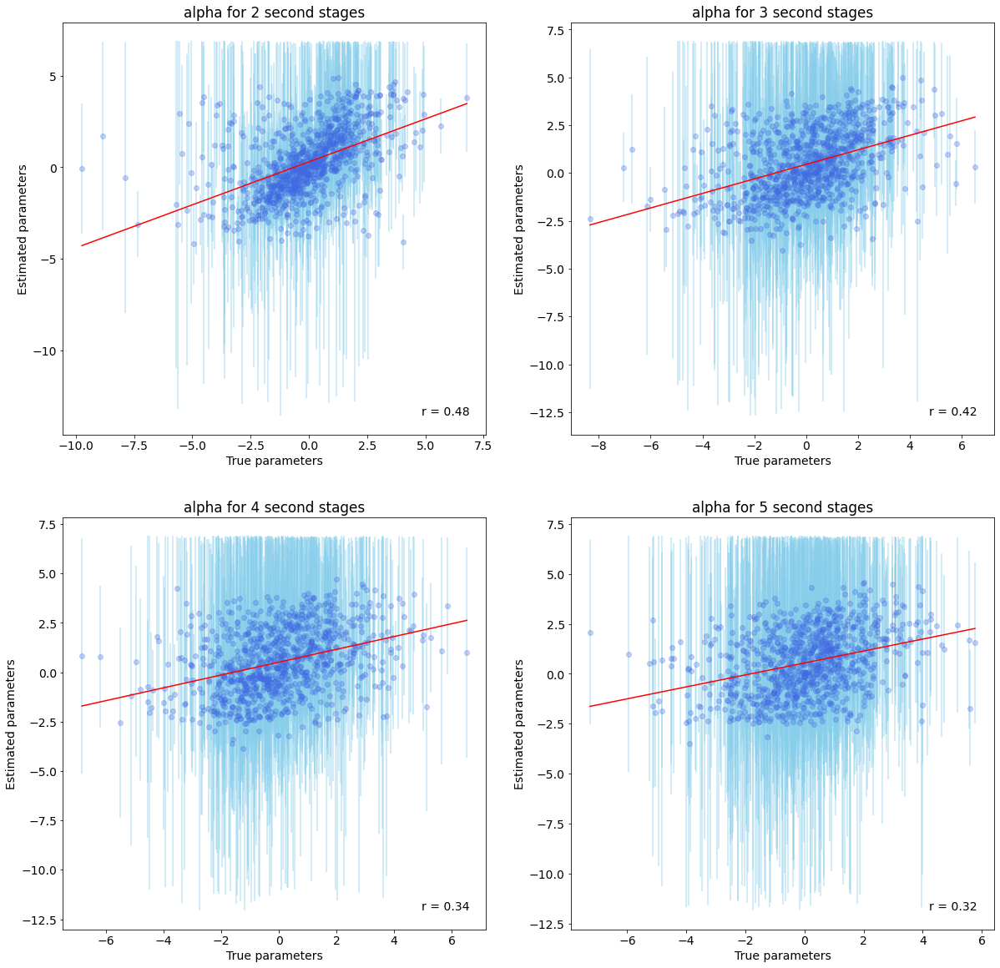

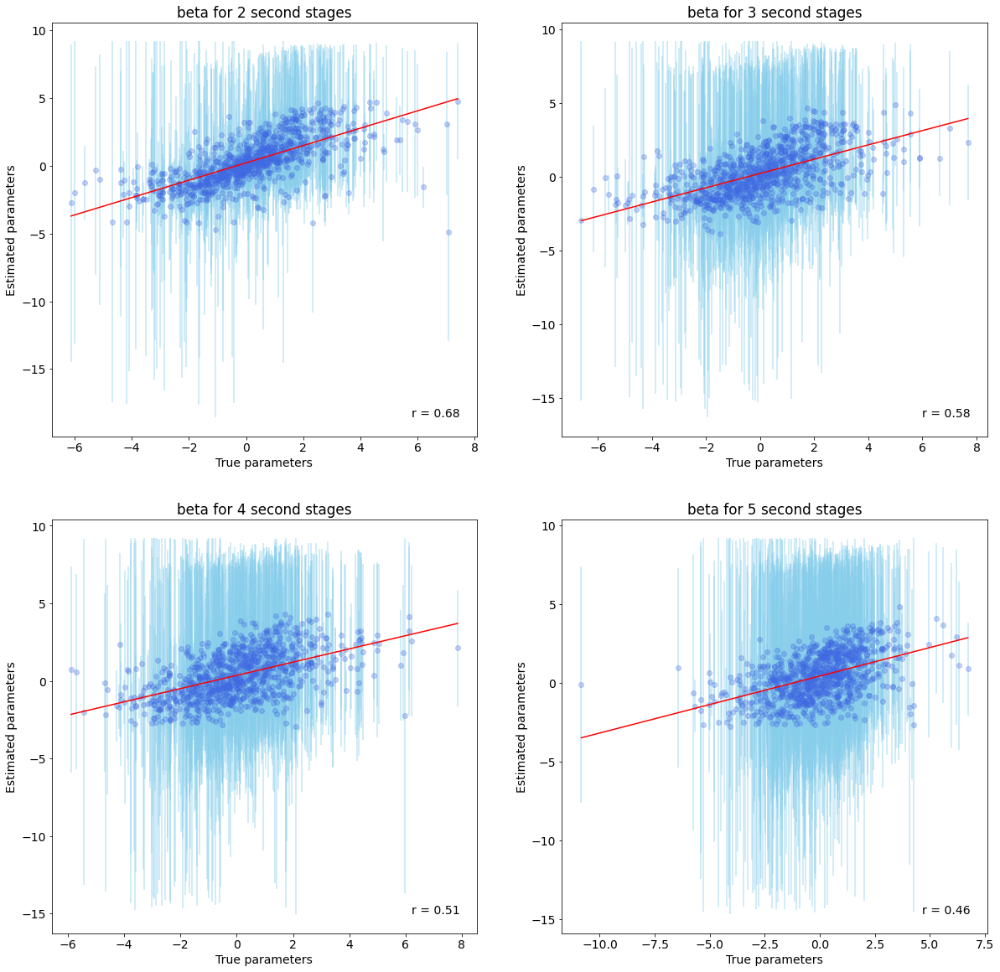

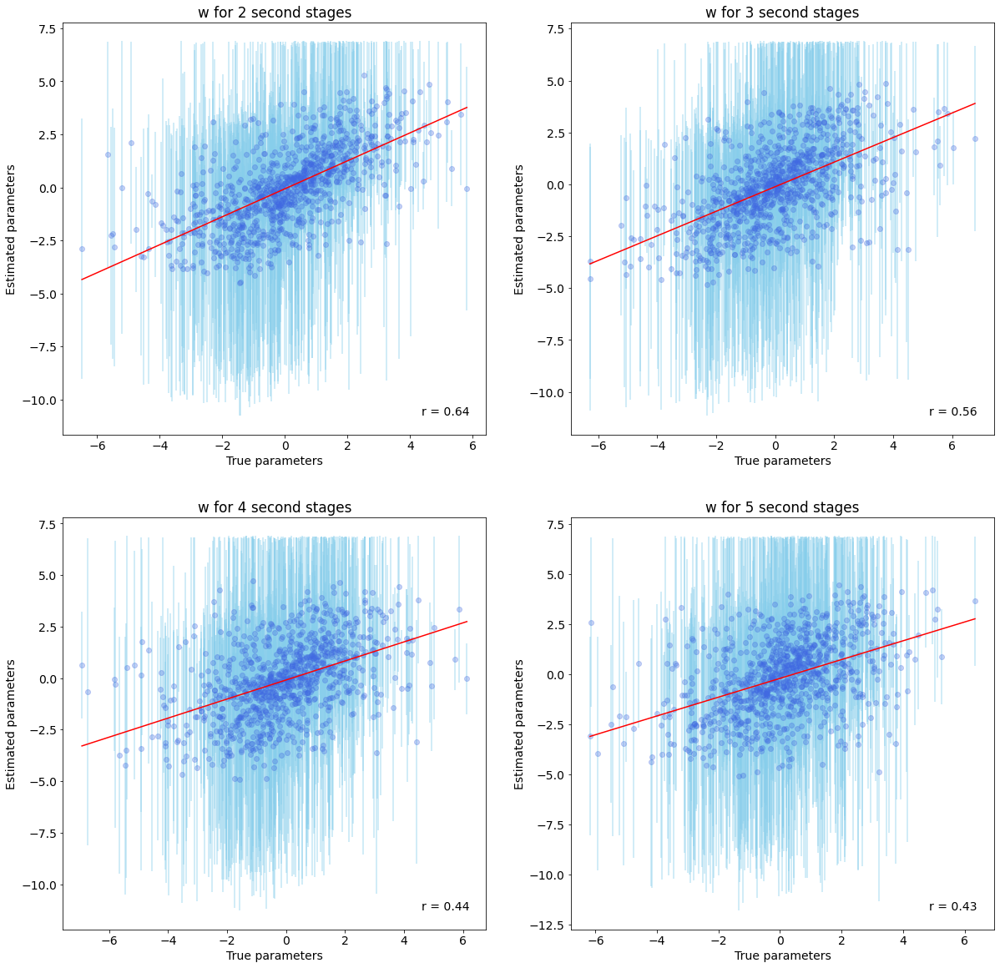

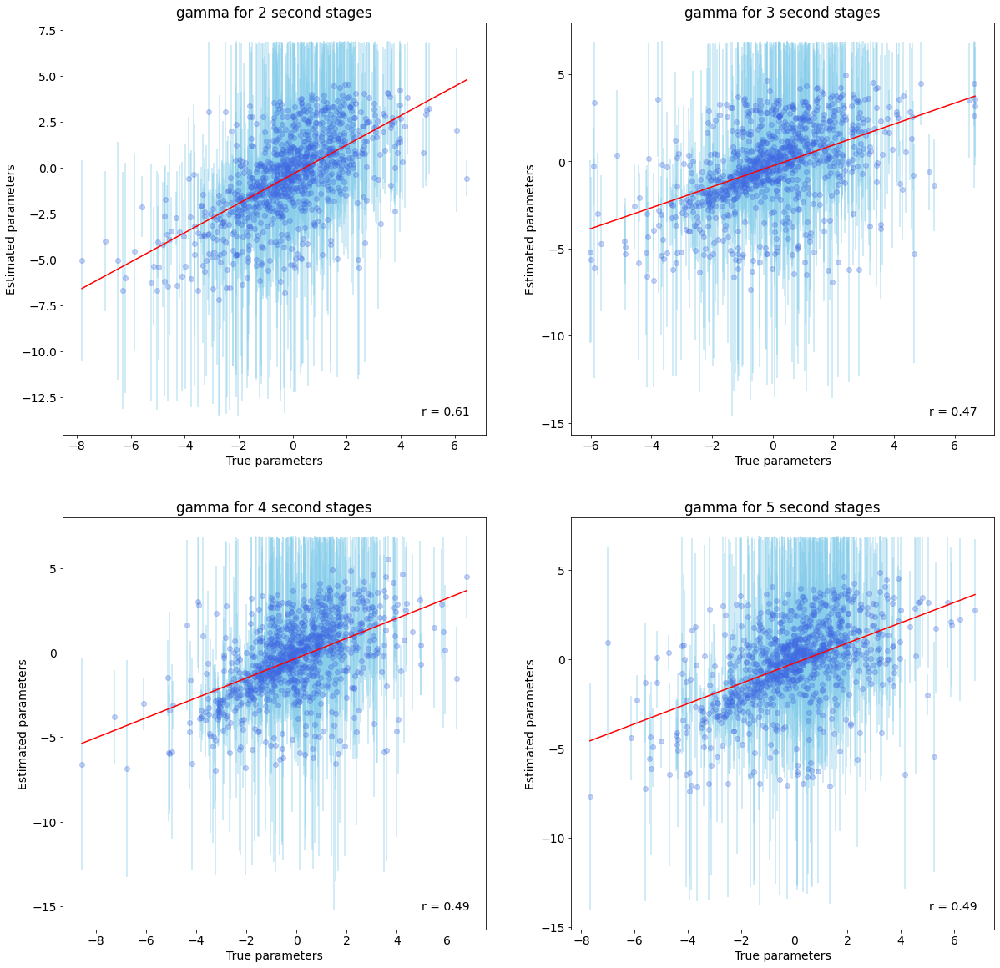

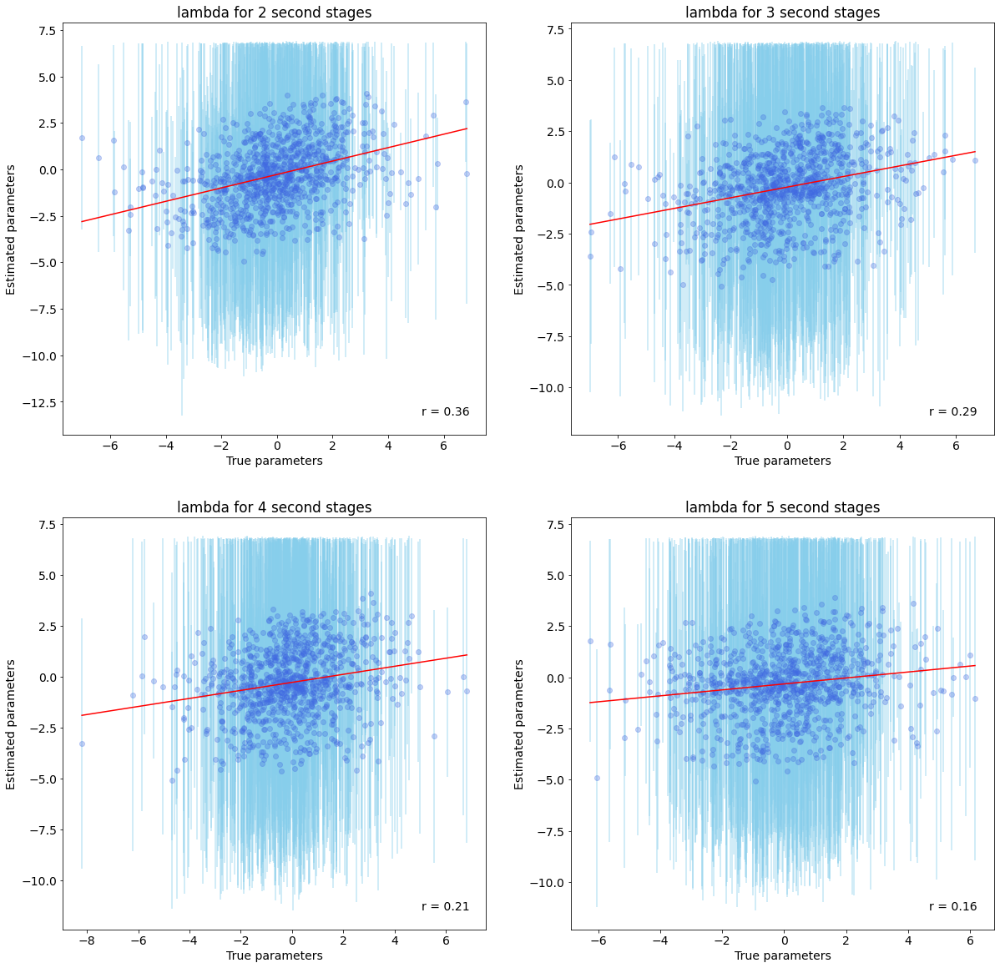

In [8]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma', 'lambda']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(20,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_lambda_' + str(second_stages[s]) + 'states_5params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x_ = corrtable[:num_data,i*2] # generating parameters
#         y_ = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
            upper_bound = 10
        transformed_param = transform_params(x_,lower_bound,upper_bound) # transform generating parameters
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        x = transformed_param
        y = raw_recovered

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples
        
        ci_upper = transform_params(ci_upper, lower_bound, upper_bound)
        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...
        
        correlation_coef = np.corrcoef(x,y)[0,1]
        r2 = correlation_coef**2
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )
               
        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        
#         print(np.min(x))
#         print(np.max(x))
#         print(np.min(y))
#         print(np.max(y))
#         print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
#         print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

# for i in datatable:
#     print(i)

## 1-2) Counterfactual: one learning rate (alpha)

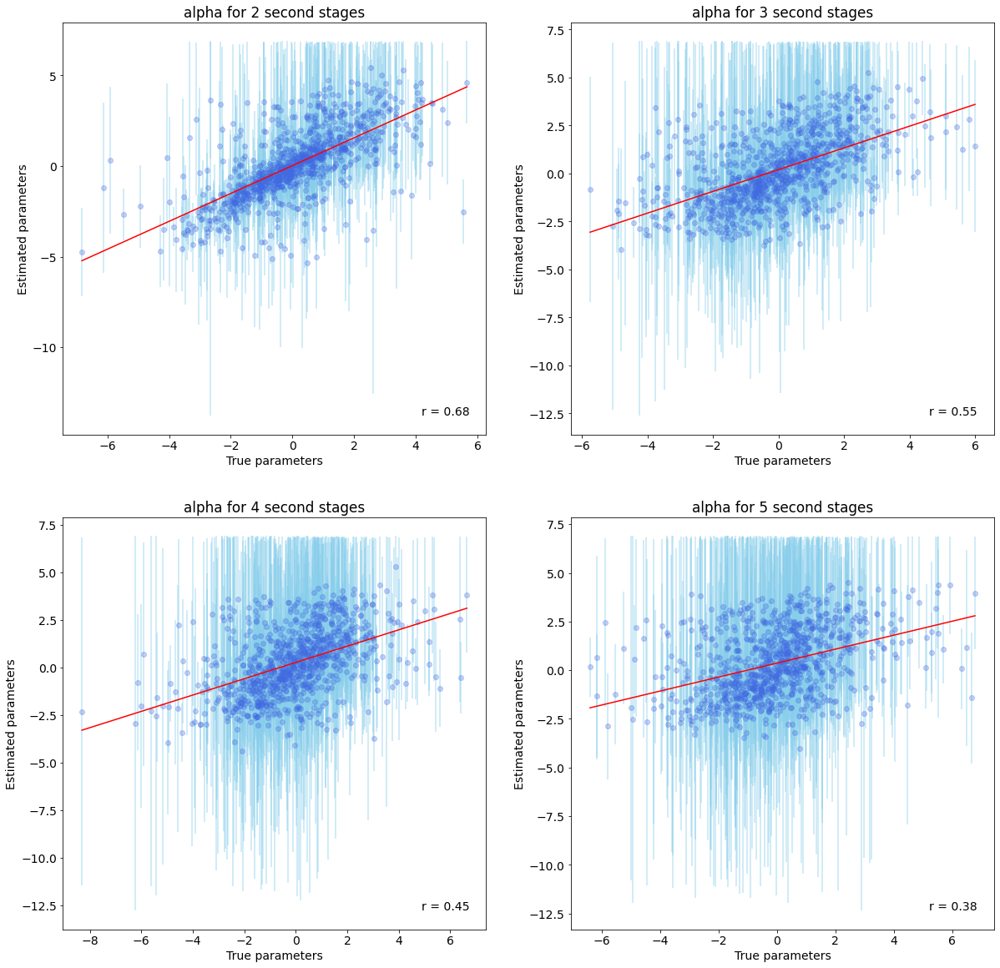

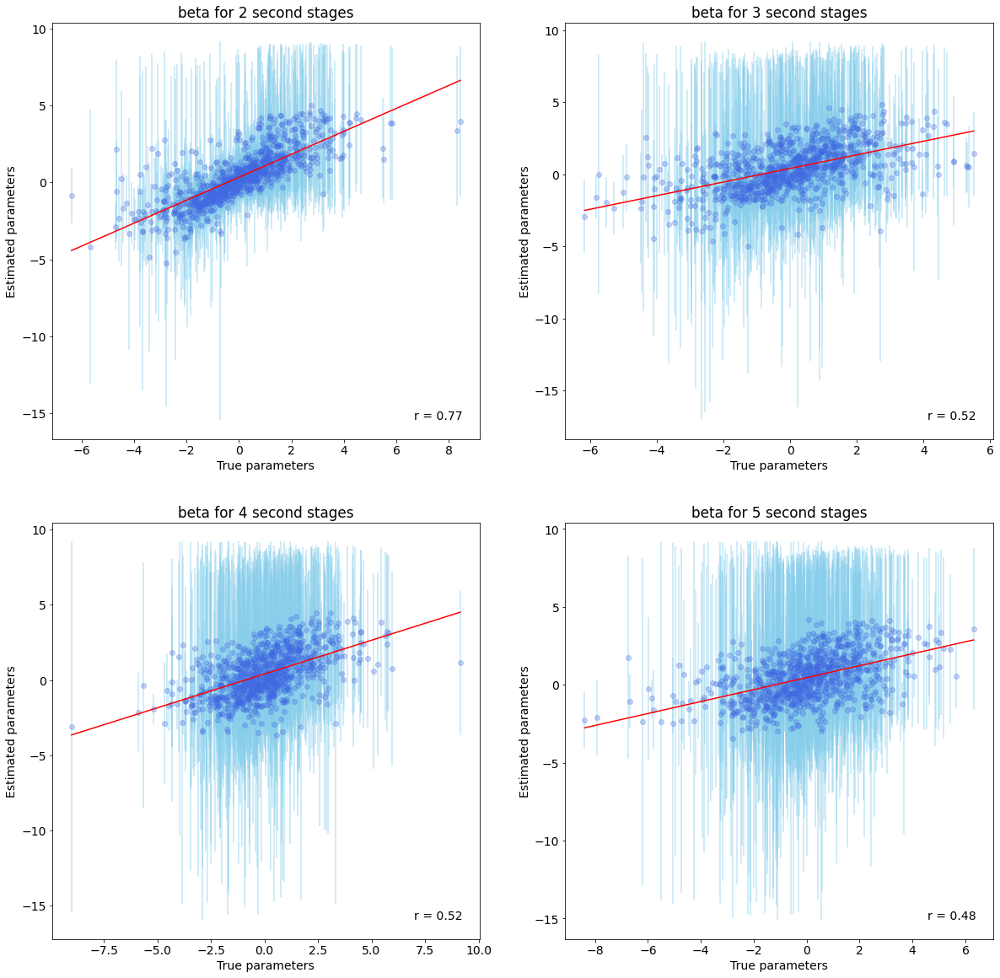

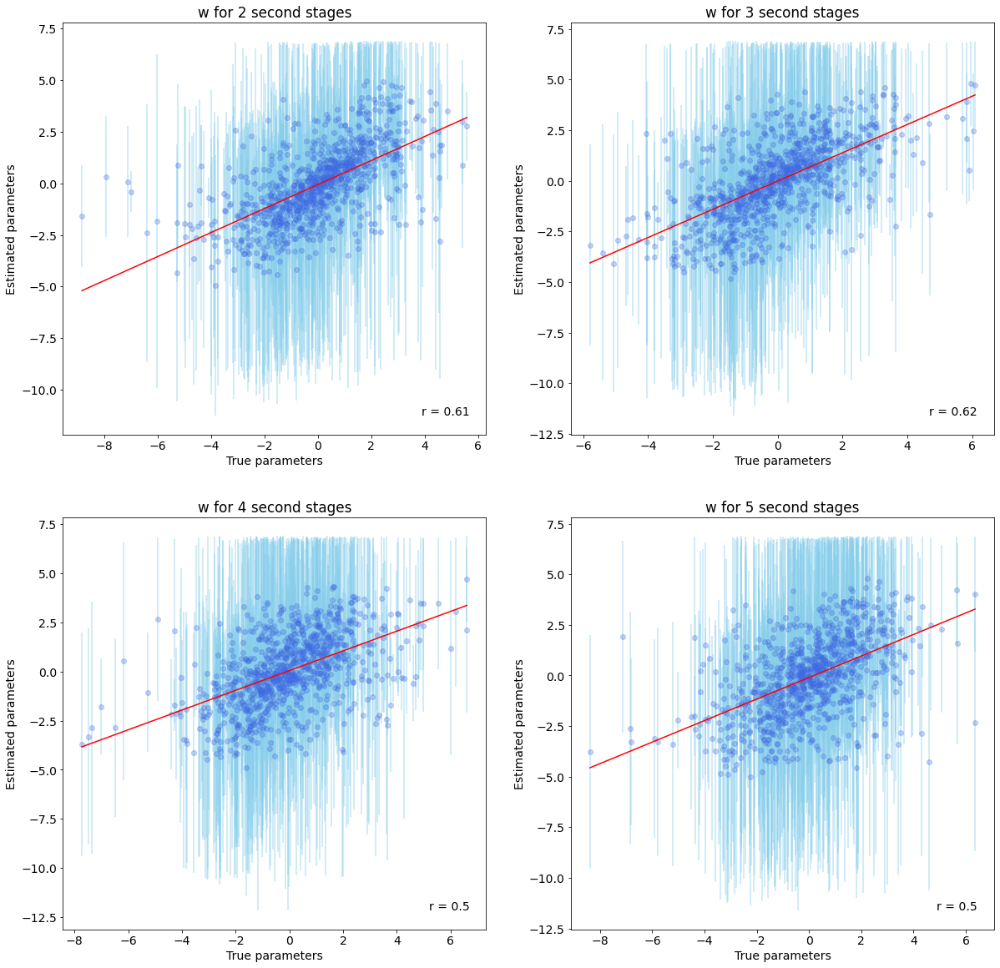

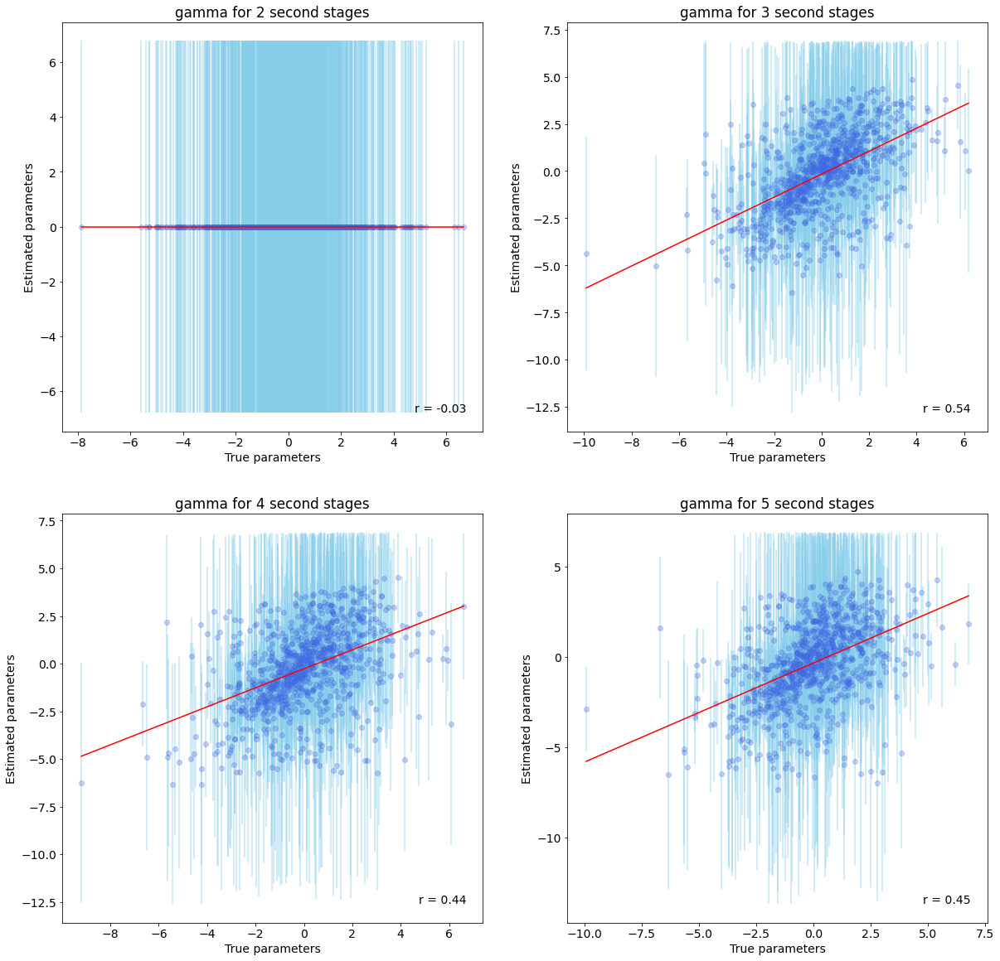

In [4]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(20,20), facecolor='w', edgecolor='k')

    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_1alpha_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x_ = corrtable[:num_data,i*2]
        y_ = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
            upper_bound = 10
        transformed_param = transform_params(x_,lower_bound,upper_bound)
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        x = transformed_param
        y = raw_recovered

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples
        
        ci_upper = transform_params(ci_upper, lower_bound, upper_bound)
        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...
        
        correlation_coef = np.corrcoef(x,y)[0,1]
        r2 = correlation_coef**2
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )
               
        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
#         print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
#         print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
#         print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

# for i in datatable:
#     print(i)

## 1-3) Counterfactual: two learning rates 

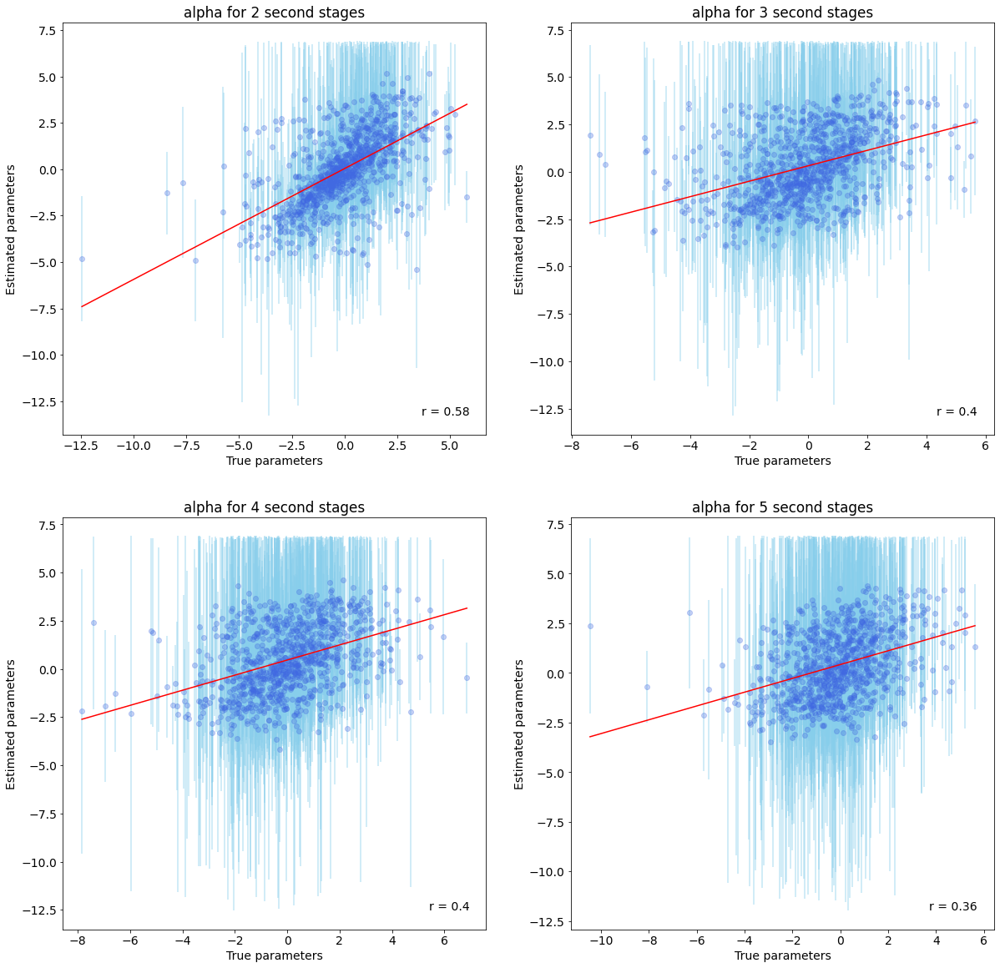

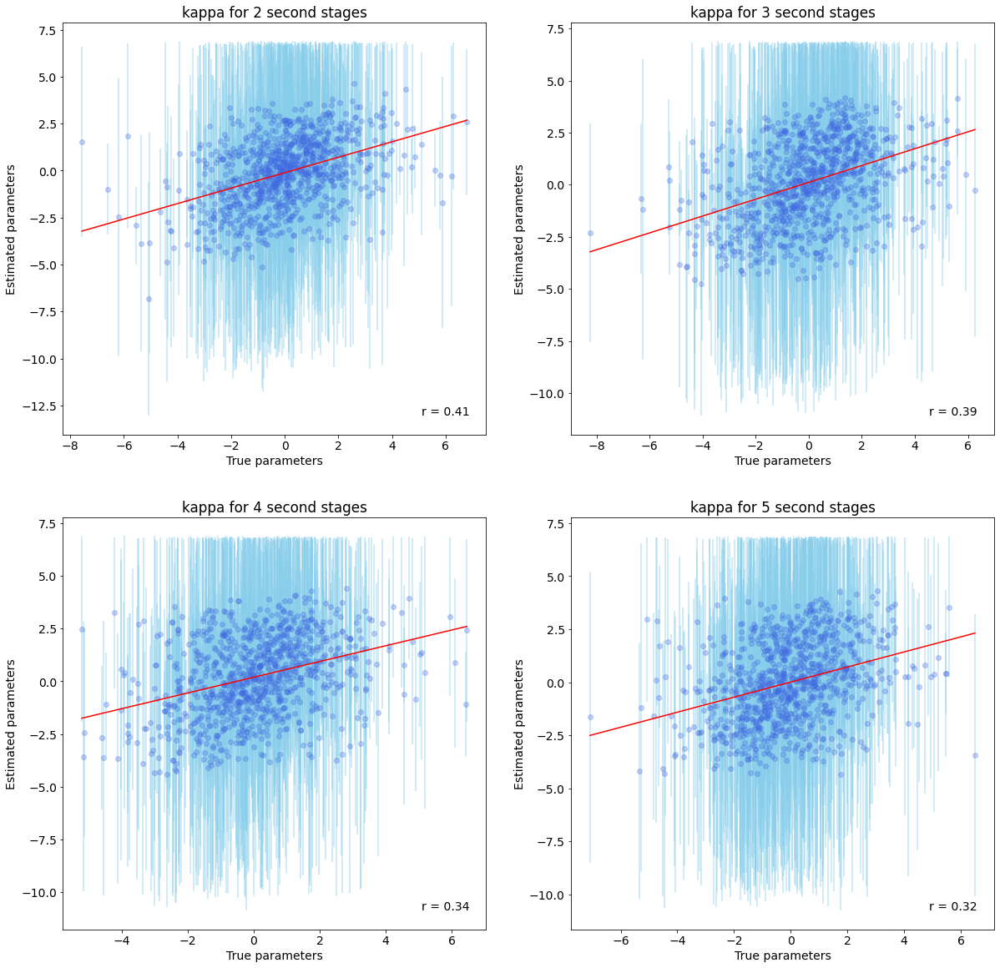

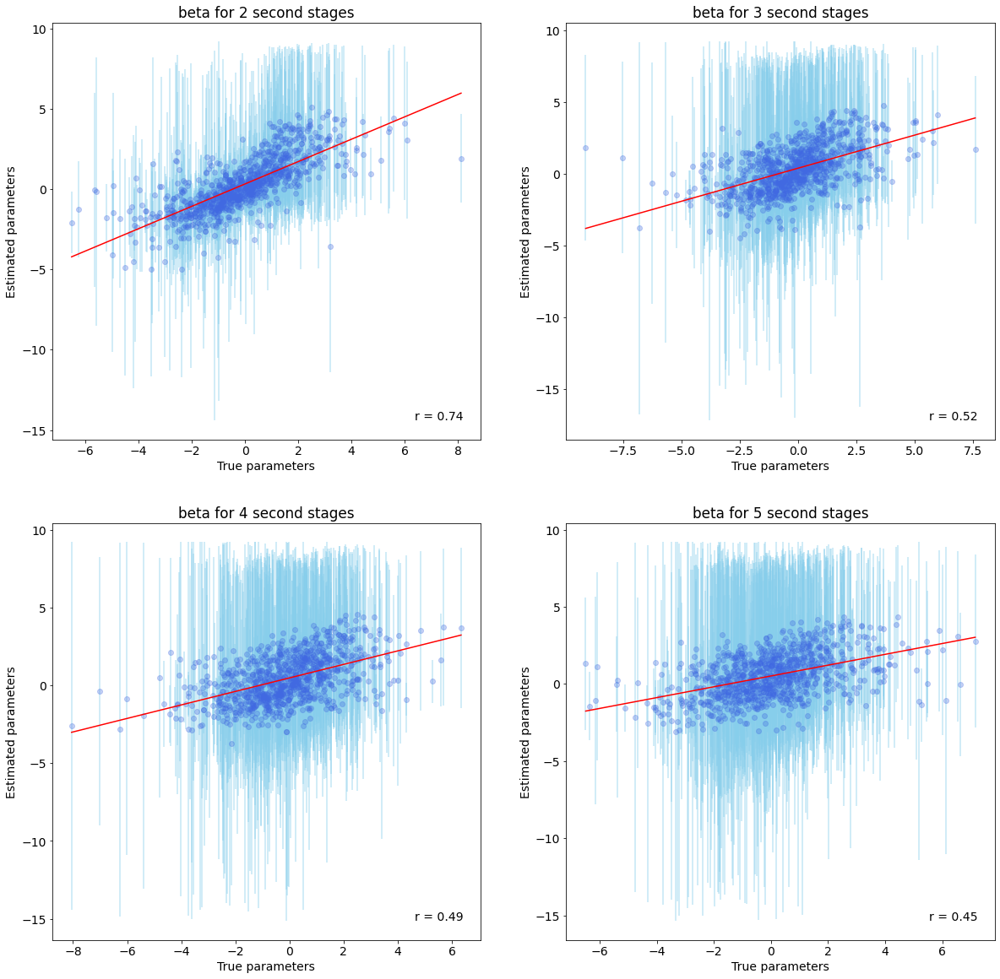

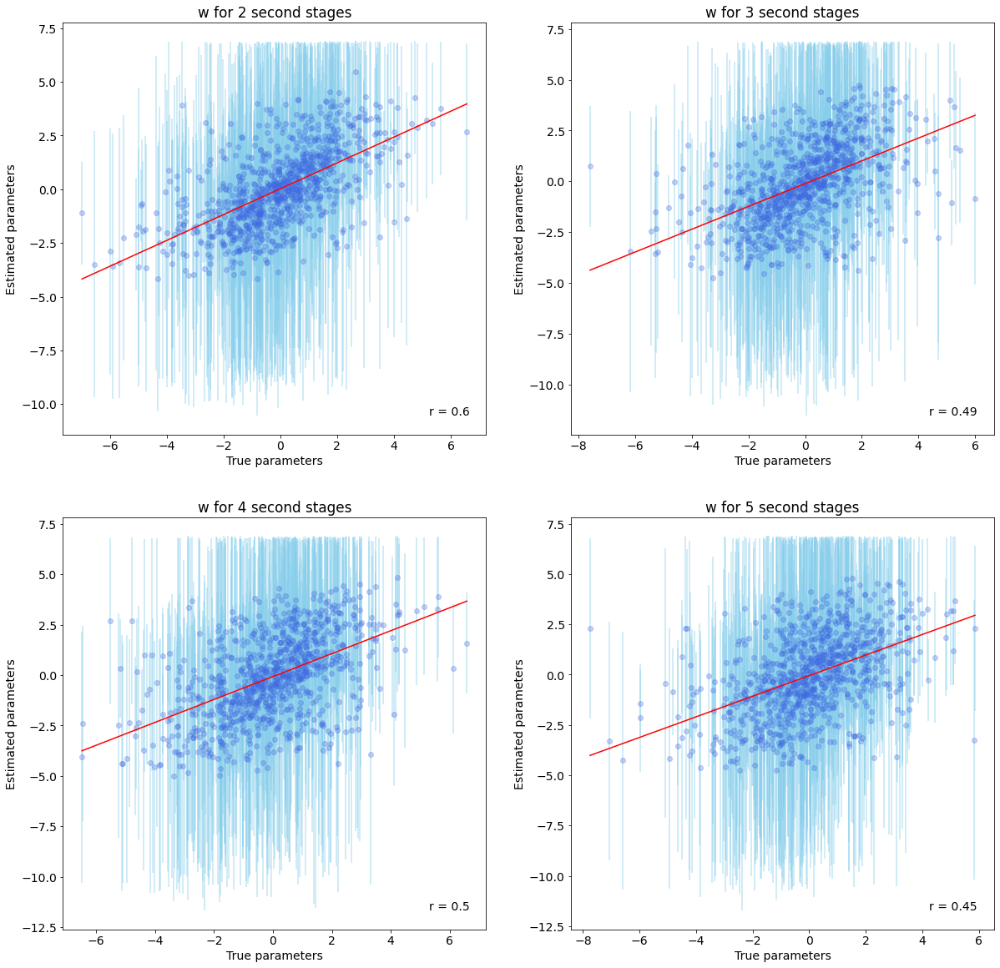

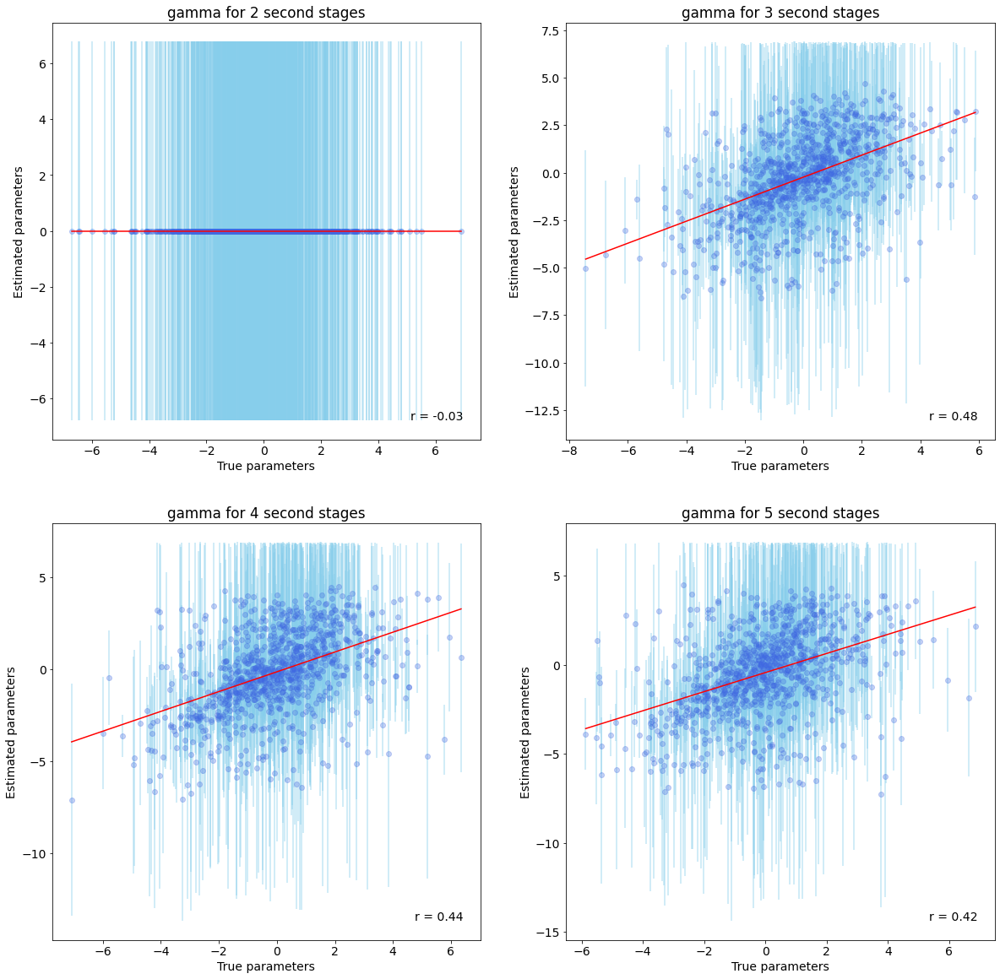

In [5]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'kappa', 'beta', 'w', 'gamma']
datatable = []
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(20,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_diff_lr_' + str(second_stages[s]) + 'states_5params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x_ = corrtable[:num_data,i*2]
        y_ = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
            upper_bound = 10
        transformed_param = transform_params(x_,lower_bound,upper_bound)
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        x = transformed_param
        y = raw_recovered

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples
        
        ci_upper = transform_params(ci_upper, lower_bound, upper_bound)
        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...
        
        correlation_coef = np.corrcoef(x,y)[0,1]
        r2 = correlation_coef**2
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )
               
        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
#         print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
#         print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
#         print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

# for i in datatable:
#     print(i)

# 2. Number of trials proportionate to number of first-stage states (100 each; 100 trials for 2, 300 trials for 3, 600 trials for 4, and 1000 trials for 5 second states)

## 2-1) TD (no counterfactual)

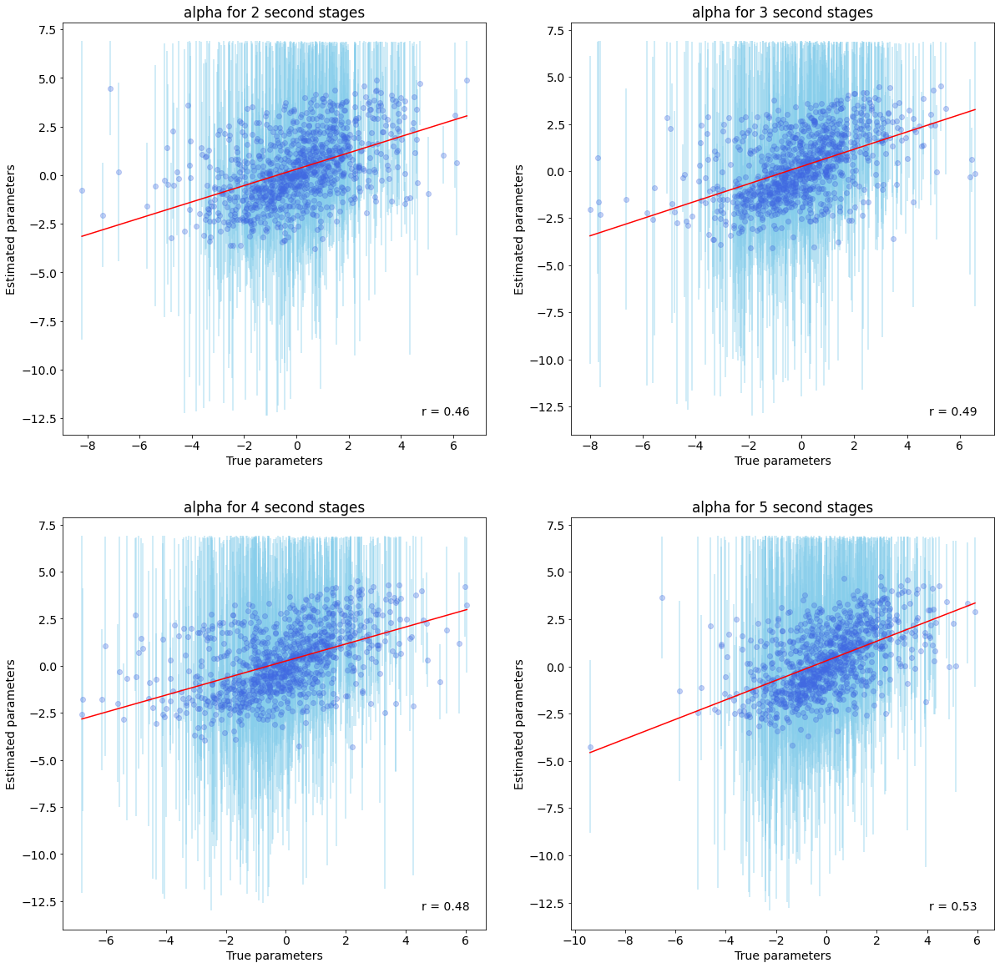

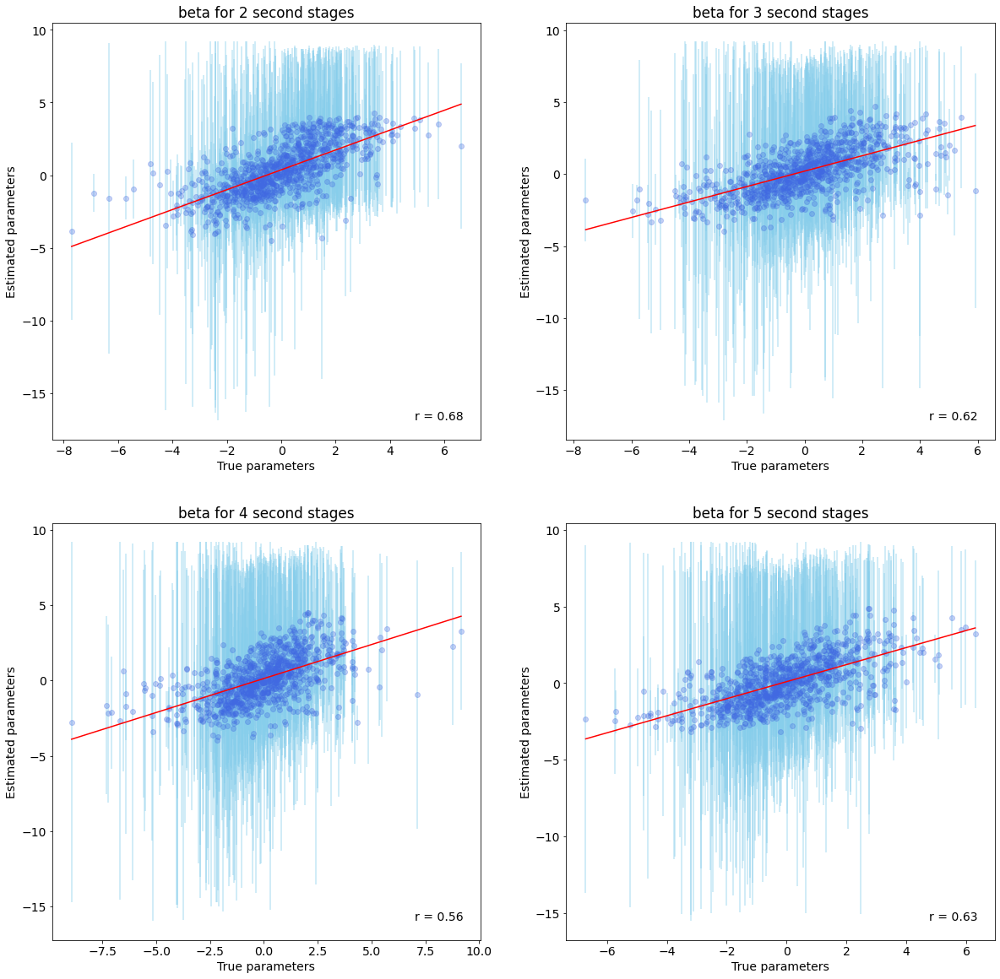

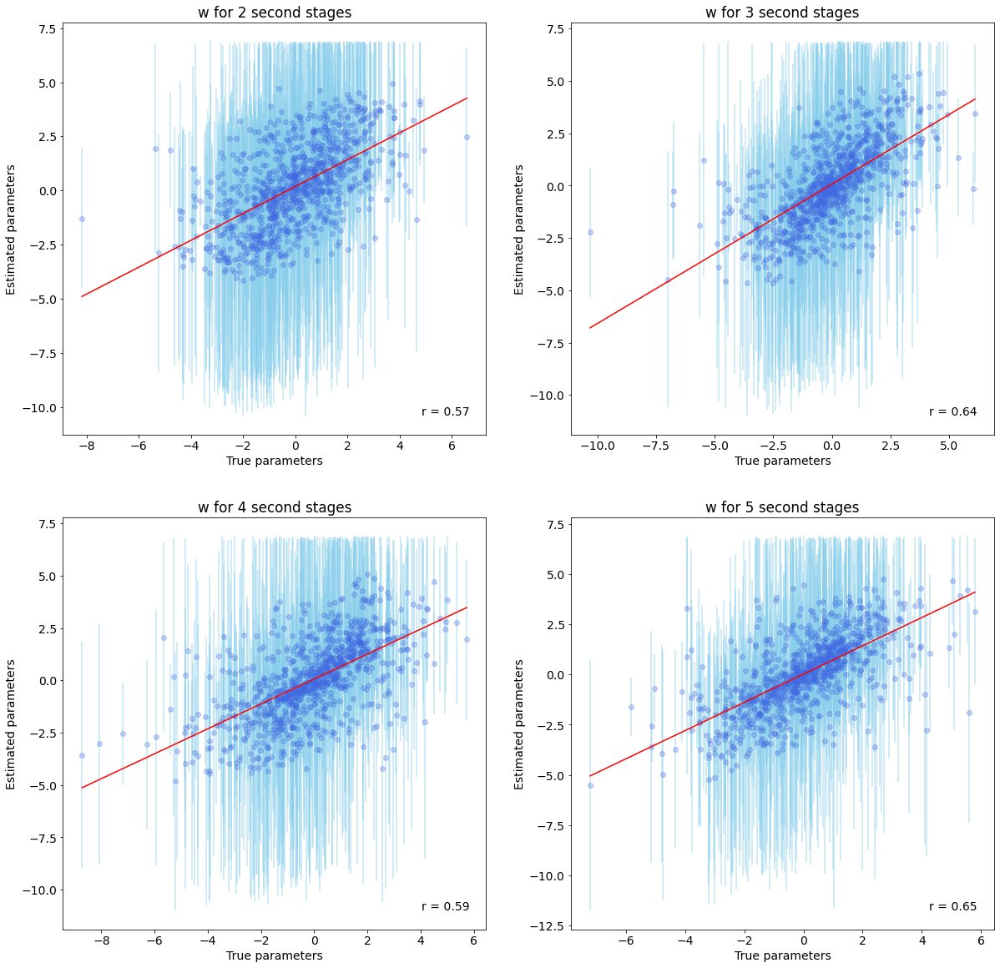

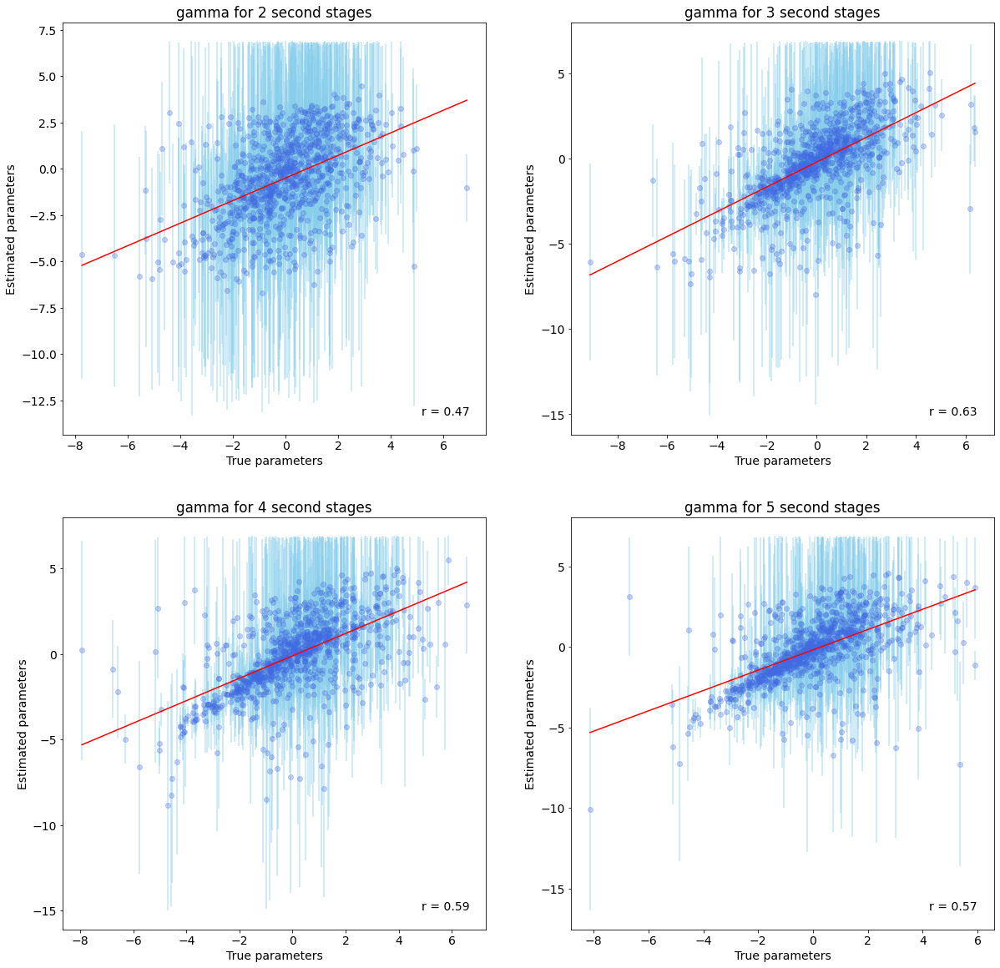

In [6]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(20,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_moretrials_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x_ = corrtable[:num_data,i*2]
        y_ = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
            upper_bound = 10
        transformed_param = transform_params(x_,lower_bound,upper_bound)
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        x = transformed_param
        y = raw_recovered

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples
        
        ci_upper = transform_params(ci_upper, lower_bound, upper_bound)
        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...
        
        correlation_coef = np.corrcoef(x,y)[0,1]
        r2 = correlation_coef**2
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )
               
        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
#         print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
#         print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
#         print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

# for i in datatable:
#     print(i)

## 2-2) Counterfactual: one learning rate (alpha)

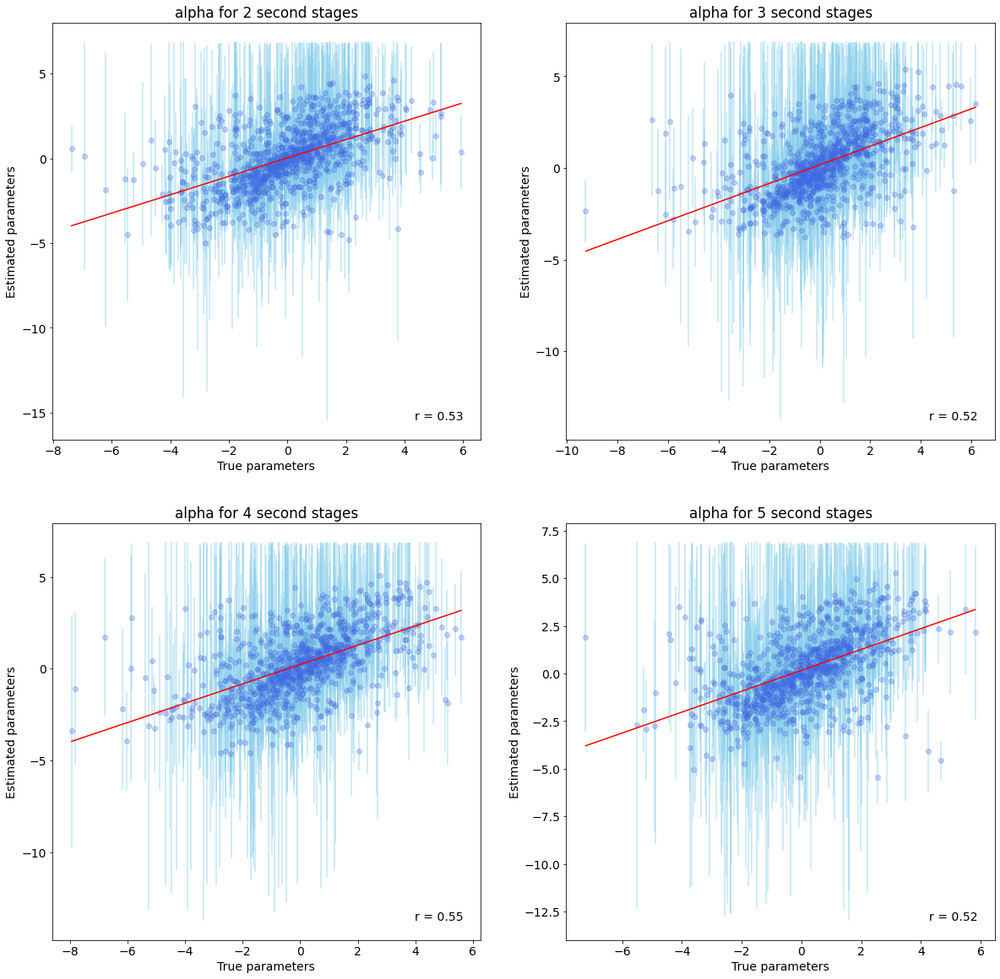

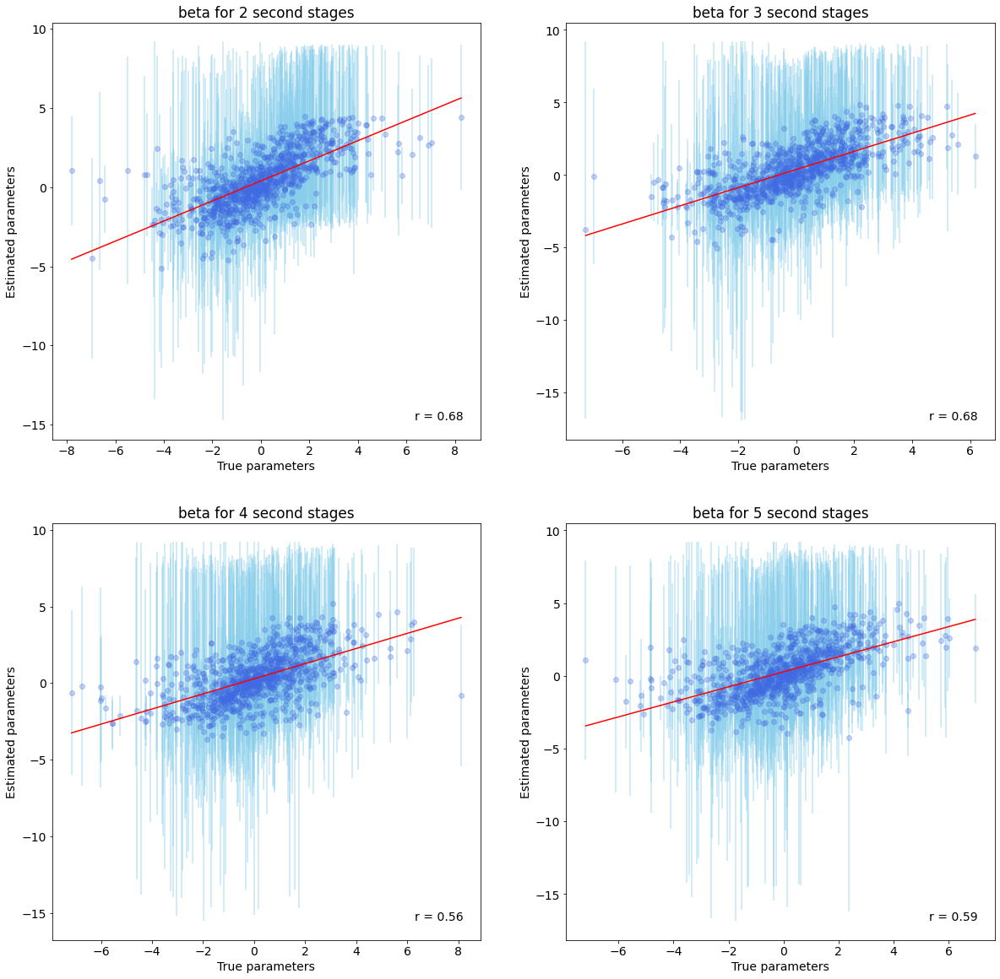

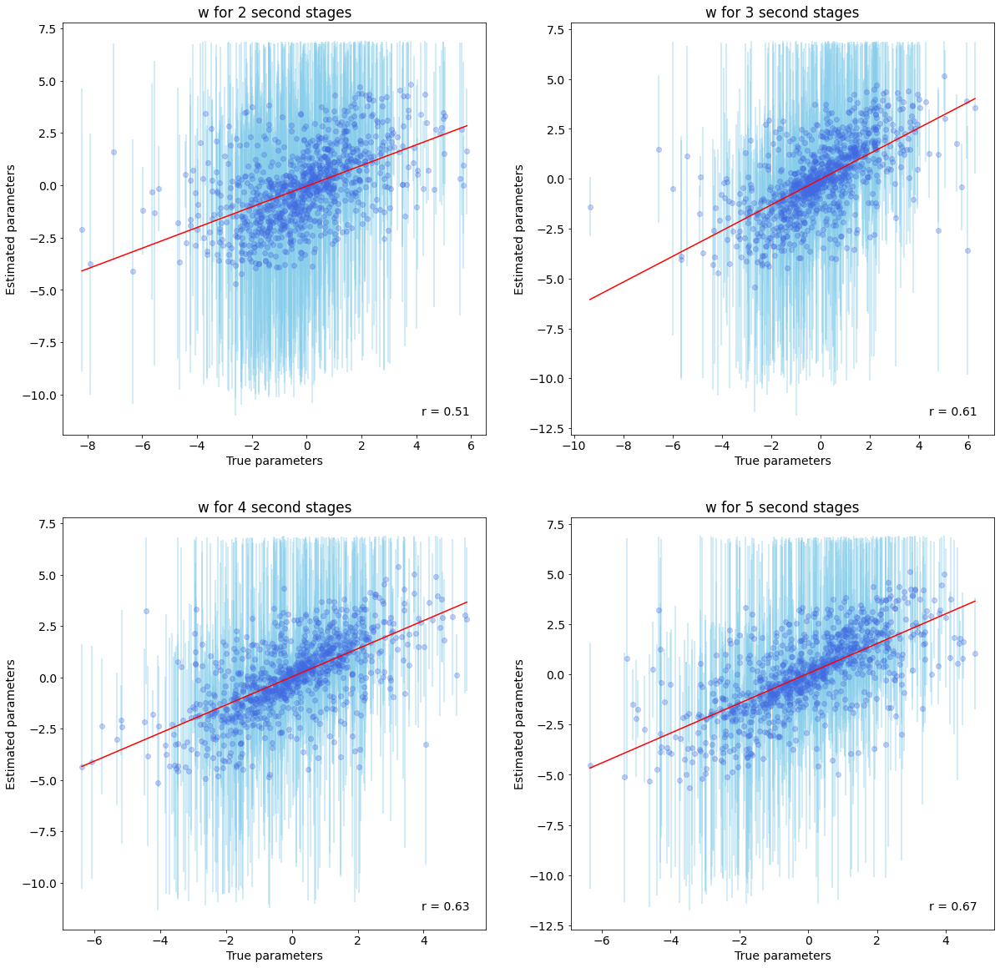

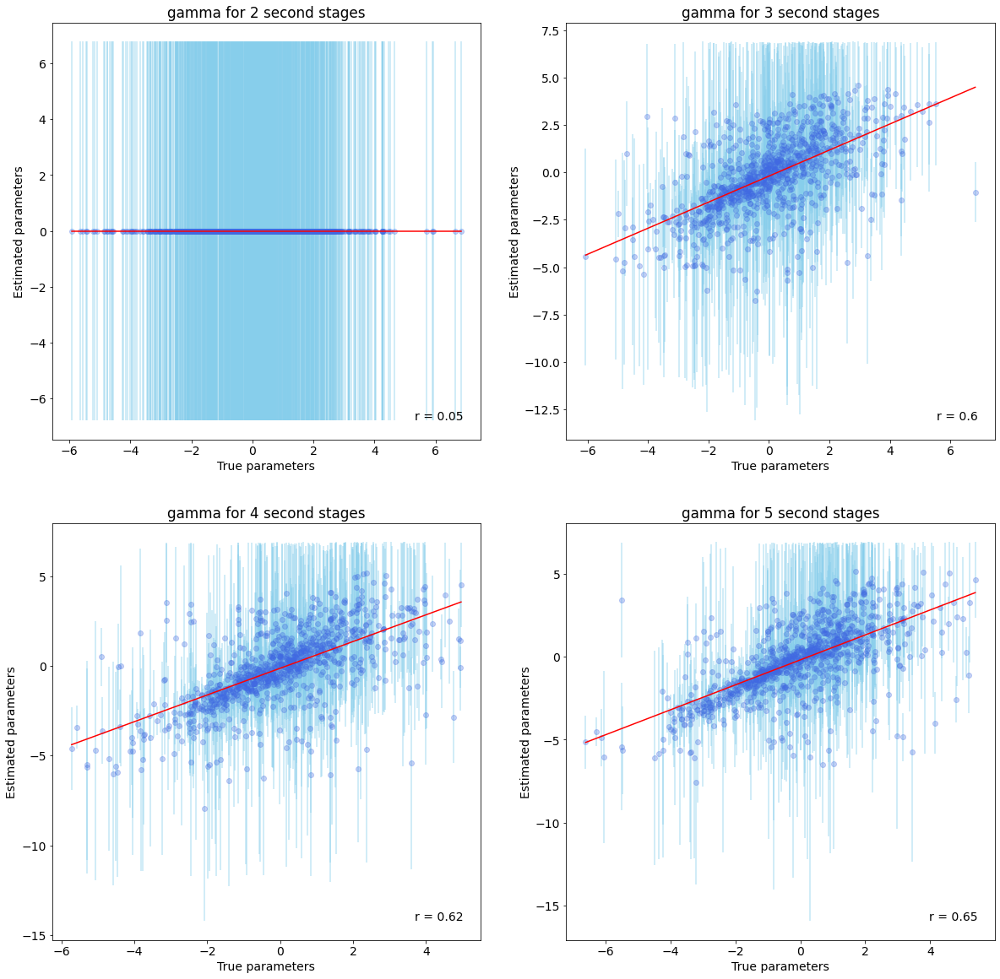

In [7]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(20,20), facecolor='w', edgecolor='k')

    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_moretrials_1alpha_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x_ = corrtable[:num_data,i*2]
        y_ = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
            upper_bound = 10
        transformed_param = transform_params(x_,lower_bound,upper_bound)
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        x = transformed_param
        y = raw_recovered

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples
        
        ci_upper = transform_params(ci_upper, lower_bound, upper_bound)
        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...
        
        correlation_coef = np.corrcoef(x,y)[0,1]
        r2 = correlation_coef**2
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )
               
        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
#         print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
#         print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
#         print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

# for i in datatable:
#     print(i)

## 2-3. Counterfactual: two learning rates

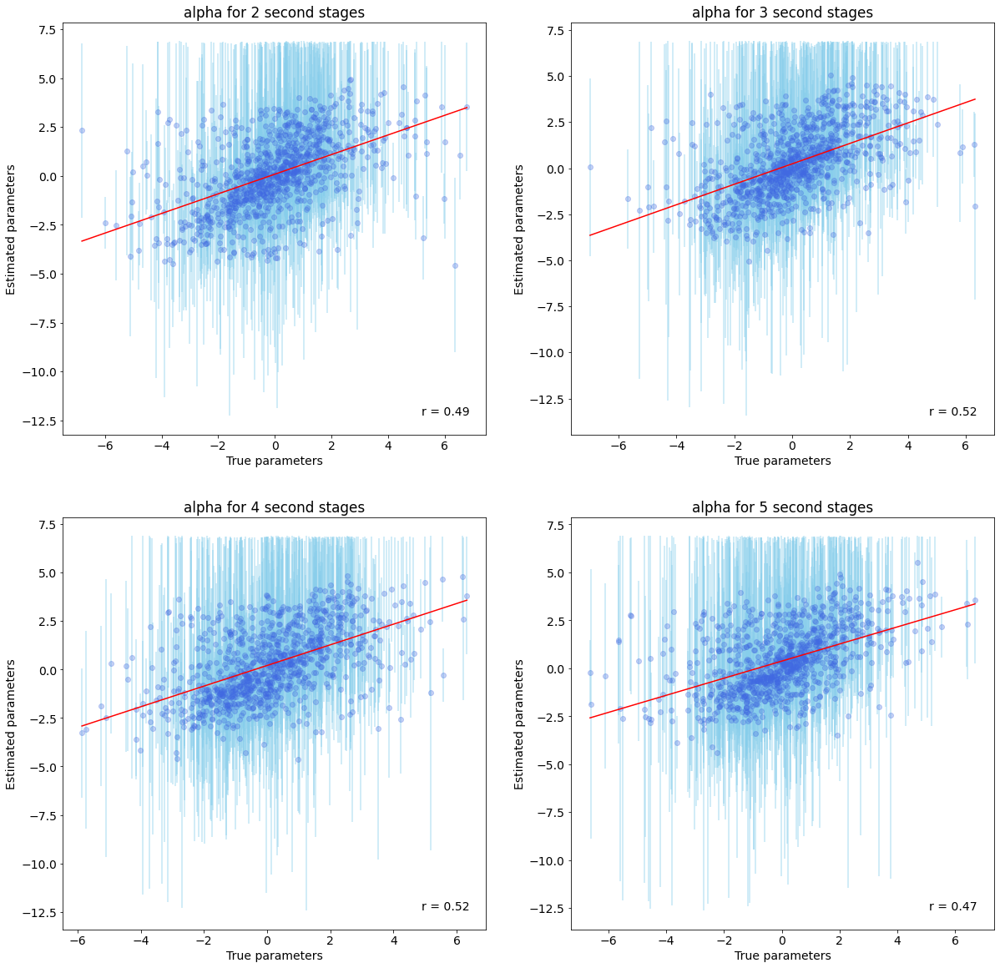

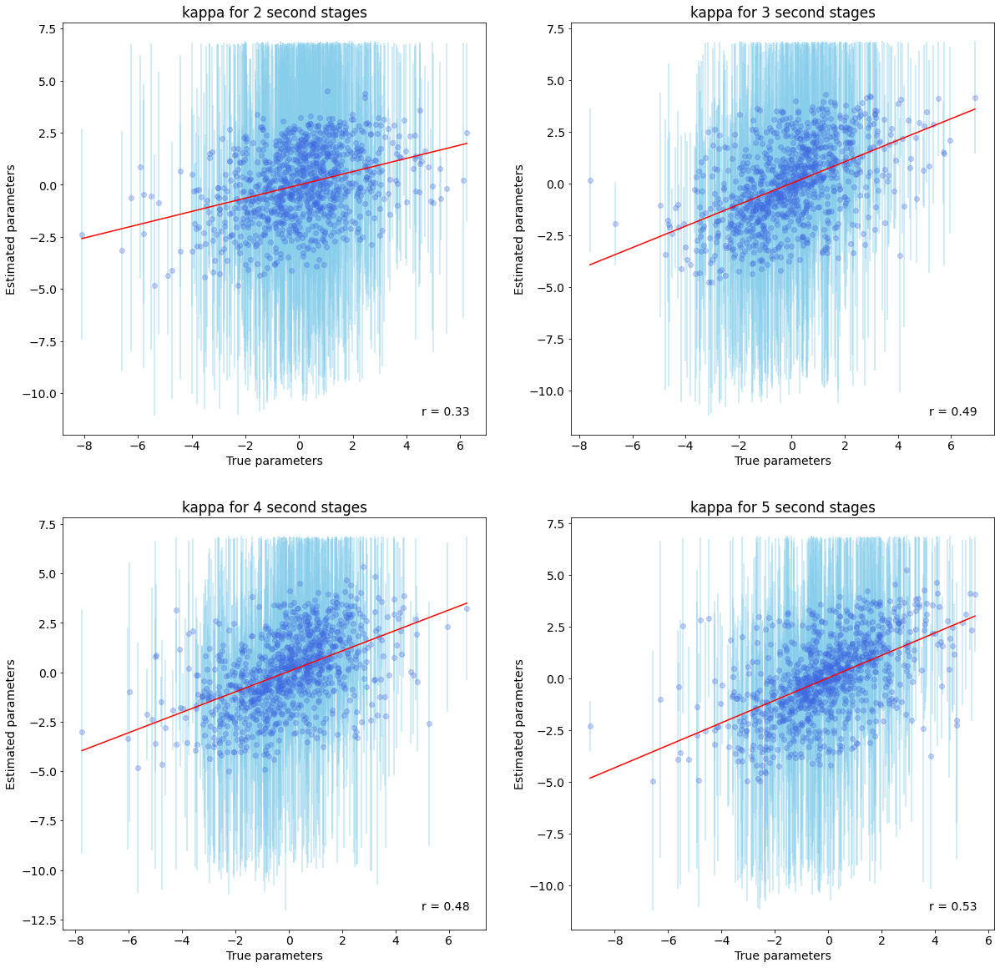

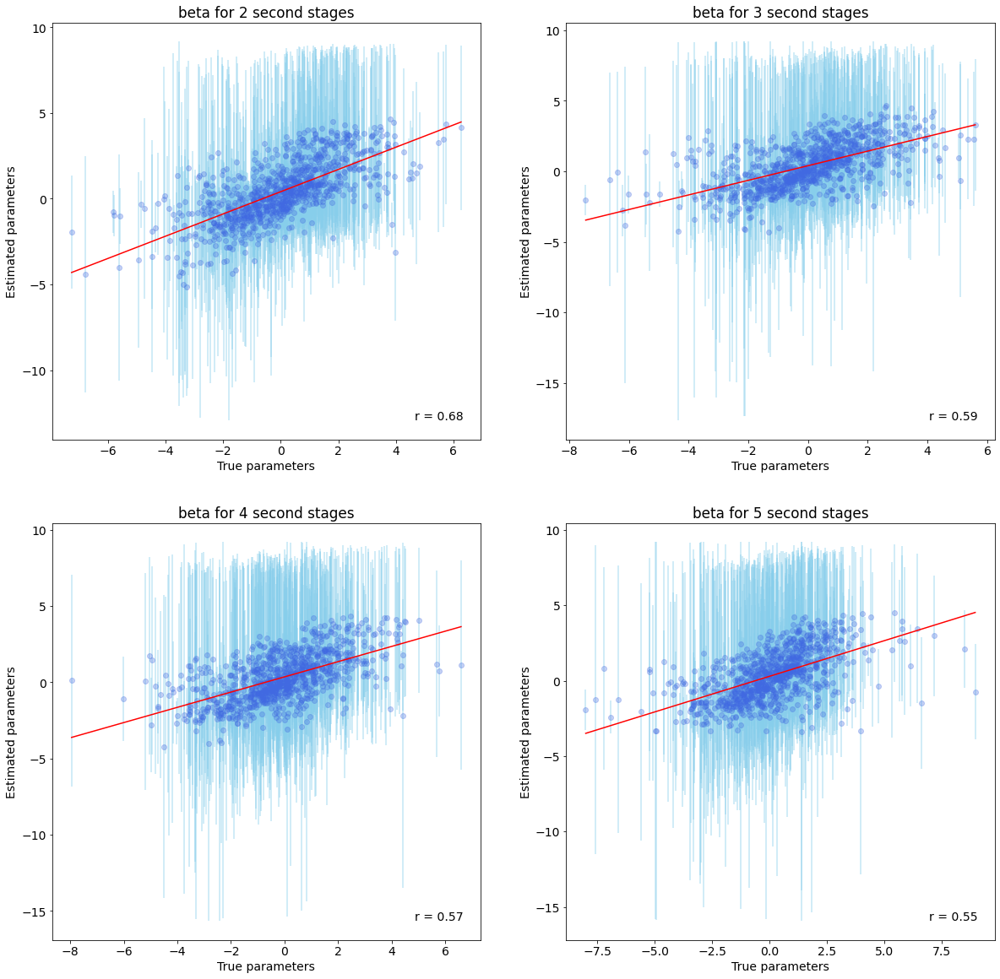

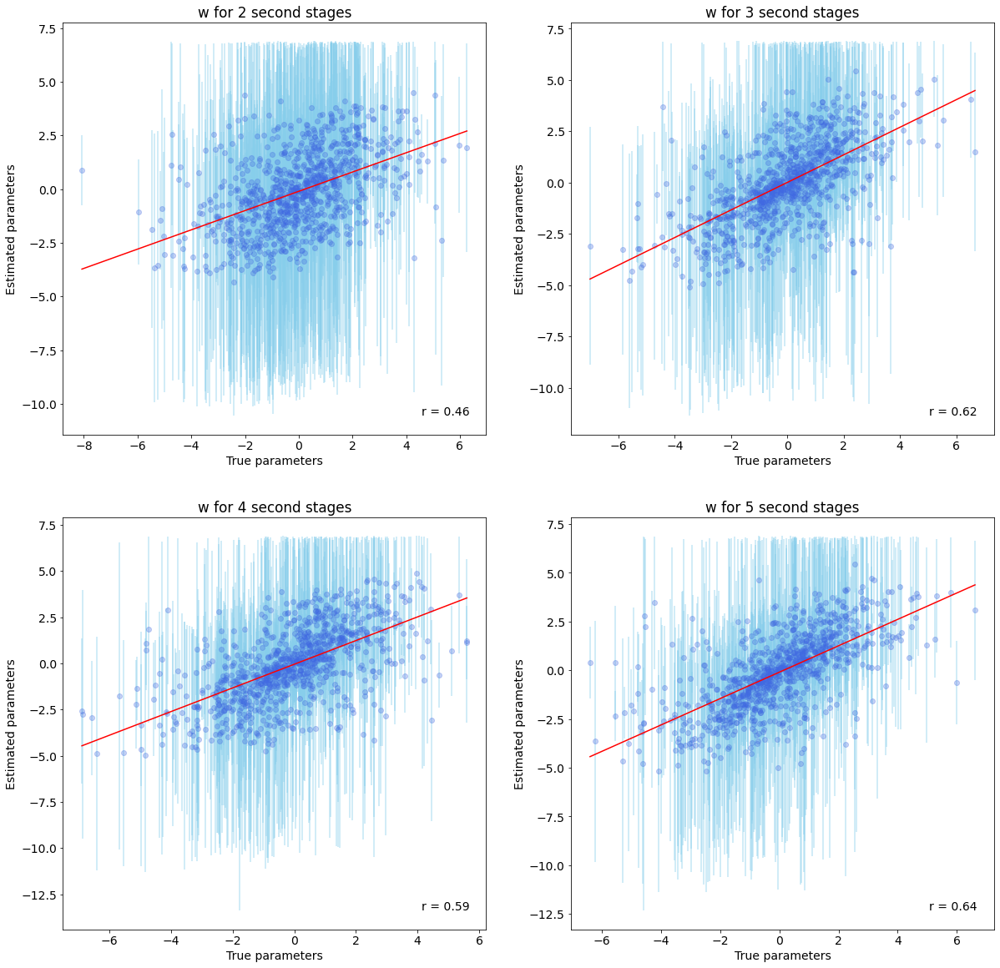

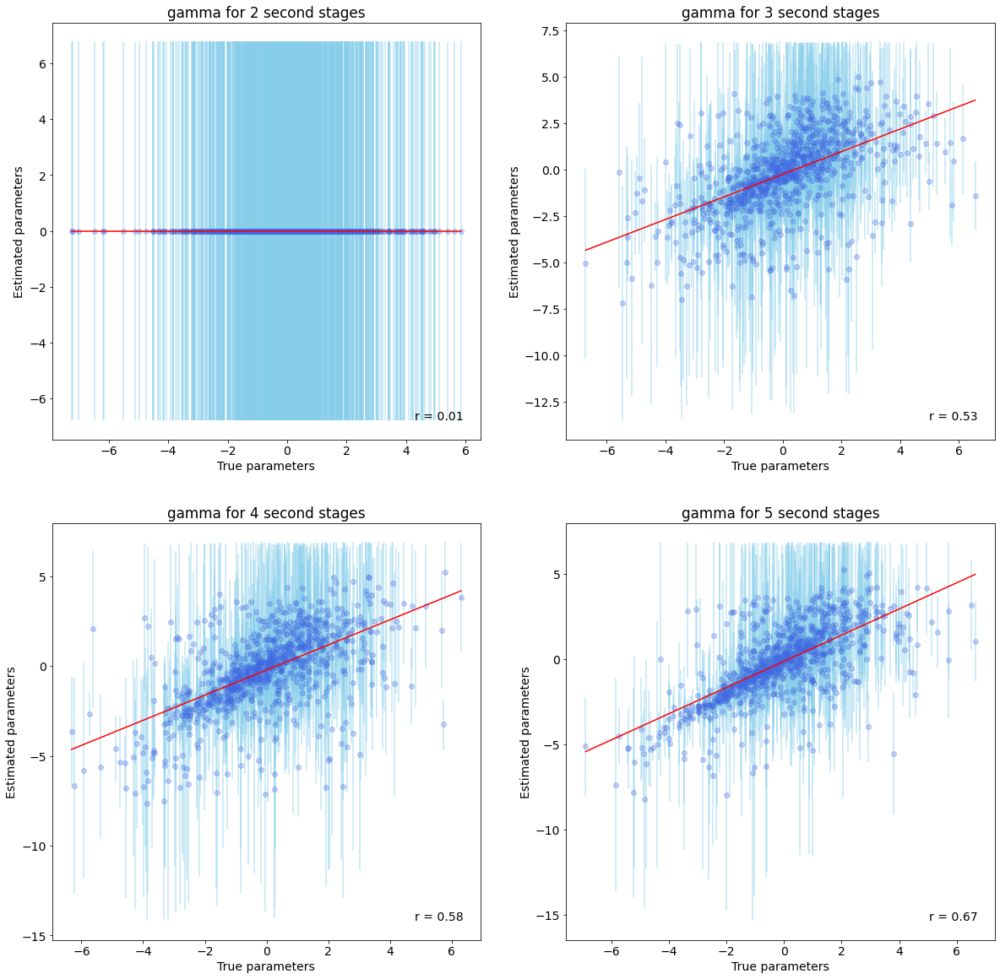

In [8]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'kappa', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(20,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_moretrials_diff_lr_' + str(second_stages[s]) + 'states_5params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]
        raw_table = curr_file['data']['raw_recovered']
        raw_table = np.asarray(raw_table)[0][0]
        
        num_data = len(corrtable)

        x_ = corrtable[:num_data,i*2]
        y_ = corrtable[:num_data,i*2+1]
        raw_recovered = raw_table[:num_data,i]
        lower_bound = 0
        upper_bound = 1
        if parameter == 'beta':
            upper_bound = 10
        transformed_param = transform_params(x_,lower_bound,upper_bound)
        
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        x = transformed_param
        y = raw_recovered

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples
        
        ci_upper = transform_params(ci_upper, lower_bound, upper_bound)
        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...
        
        correlation_coef = np.corrcoef(x,y)[0,1]
        r2 = correlation_coef**2
        corr_coef = np.corrcoef(transformed_param, raw_recovered)[0,1]

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )
               
        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

#         ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
#             xytext=(-20, 20), textcoords='offset pixels',
#             horizontalalignment='right',
#             verticalalignment='bottom')
        ax.annotate('r = '+str(np.round(corr_coef,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
    
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
#         print("The r for {} {} stages: {}".format(parameter, second_stages[s], np.round(correlation_coef,2)))
#         print("The r2 for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
#         print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(corr_coef,2)))
        datatable.append(np.round(corr_coef,2))

# for i in datatable:
#     print(i)